### NISHA JAIN

## The Sparks  Foundation - Internship

 # #TASK 3 -        Expolatory data analysis on Retail(Superstore data)

### The aim of the project is to do EDA(Expolatory data analysis) on the Superstore data and find out the weak areas in which one can improve and maximize it's profit.

#### Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import sklearn 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

#### Importing the dataset

In [2]:
df=pd.read_csv(r'C:\Users\Lenovo\Desktop\GRIP SPARK\SampleSuperstore.csv')
df.head(5)

,Ship Mode,Segment,Country,City,State,Postal Code,Region,Category,Sub-Category,Sales,Quantity,Discount,Profit
0,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Bookcases,261.9600,2,0.00,41.9136
1,Second Class,Consumer,United States,Henderson,Kentucky,42420,South,Furniture,Chairs,731.9400,3,0.00,219.5820
2,Second Class,Corporate,United States,Los Angeles,California,90036,West,Office Supplies,Labels,14.6200,2,0.00,6.8714
3,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Furniture,Tables,957.5775,5,0.45,-383.0310
4,Standard Class,Consumer,United States,Fort Lauderdale,Florida,33311,South,Office Supplies,Storage,22.3680,2,0.20,2.5164


#### Shape of dataset

In [3]:
df.shape

(9994, 13)

#### Checking for NULL values

In [4]:
df.isnull().sum()

Ship Mode       0
Segment         0
Country         0
City            0
State           0
Postal Code     0
Region          0
Category        0
Sub-Category    0
Sales           0
Quantity        0
Discount        0
Profit          0
dtype: int64

#### Column Names

In [5]:
df.columns

Index(['Ship Mode', 'Segment', 'Country', 'City', 'State', 'Postal Code',
       'Region', 'Category', 'Sub-Category', 'Sales', 'Quantity', 'Discount',
       'Profit'],
      dtype='object')

In [6]:
df.columns.nunique()

13

#### Describe Method for statistical Analysis

In [7]:
df.describe()

,Postal Code,Sales,Quantity,Discount,Profit
count,9994.000000,9994.000000,9994.000000,9994.000000,9994.000000
mean,55190.379428,229.858001,3.789574,0.156203,28.656896
std,32063.693350,623.245101,2.225110,0.206452,234.260108
min,1040.000000,0.444000,1.000000,0.000000,-6599.978000
25%,23223.000000,17.280000,2.000000,0.000000,1.728750
50%,56430.500000,54.490000,3.000000,0.200000,8.666500
75%,90008.000000,209.940000,5.000000,0.200000,29.364000
max,99301.000000,22638.480000,14.000000,0.800000,8399.976000


#### Checking for outliers

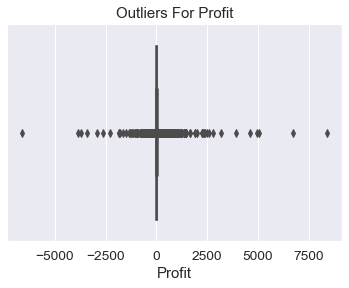

In [120]:
sns.boxplot(df.Profit)
plt.title('Outliers For Profit')
plt.show()

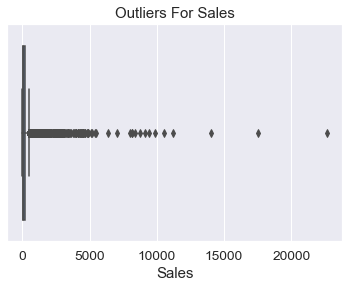

In [121]:
sns.boxplot(df.Sales)
plt.title('Outliers For Sales')
plt.show()

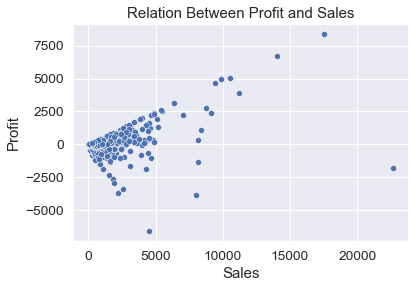

In [122]:
sns.scatterplot(x=df.Sales,y=df.Profit,data=df,palette='coolwarm')
plt.title('Relation Between Profit and Sales')
plt.show()

Profit is not only dependent on Sales, there may be other factors which are affecting profit.

#### Looking for unique value counts visually

#### HOW SEGMENTS ARE DIVIDED 

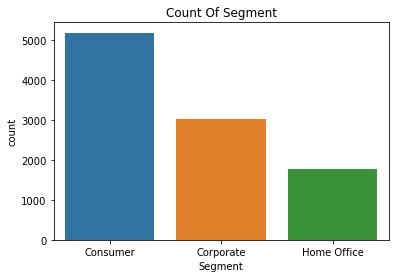

In [14]:
sns.countplot(df.Segment)
plt.title('Count Of Segment')
plt.show()

Segment is divided into 3 categories and consumer segment is the most widely sold category.

#### WHAT ARE THE SHIP MODES FOR DELIVERY OF PRODUCTS

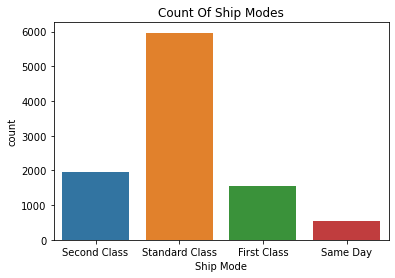

In [15]:
sns.countplot(df['Ship Mode'])
plt.title('Count Of Ship Modes')
plt.show()

There are 4 types of ship mode and the company is mainly using the Standard Class mode as the means for the deliveries, Same Day mode was used  less than a 1000 times.

Same Day mode might be expensive that's why lesser number of people are using it.

#### DIVISION OF REGIONS

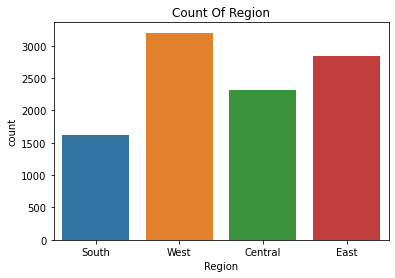

In [16]:
sns.countplot(df.Region)
plt.title('Count Of Region')
plt.show()

#### TYPES OF CATEGORIES

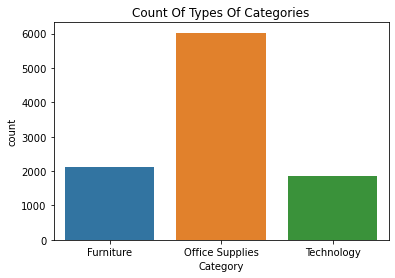

In [17]:
sns.countplot(df.Category)
plt.title('Count Of Types Of Categories')
plt.show()

Office supplies are the most selling category among the 3 and both the remaining categories are having almost same numbers.

#### WHAT ARE THE SUB CATEGORIES ?

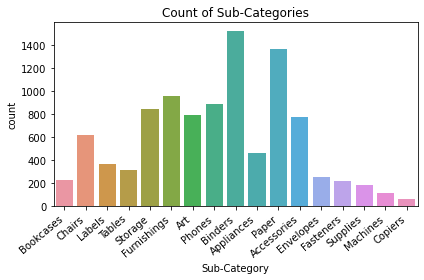

In [18]:
ax = sns.countplot(df['Sub-Category'])

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.title('Count of Sub-Categories')
plt.tight_layout()
plt.show()

We can see that Binders and Papers are the most selling categories, and this is proving the fact that office supplies is the most sold category.


Technology is the lowest selling category and this is verified from the sub category that the machines and copiers are the least selling products, even less than 100.

#### We need to find out the relationships between the different variables to figure out that how these variables are affecting sales and profit.

## Relationship between the State and the Ship mode

the relationship is used to analyse which state is using what kind of mode of shipping.

Each plot is representing the one type of mode of shipping and all the states, each plot is the count of that specific mode of shipment with respect to state.

#### #Second Class Ship Mode and State

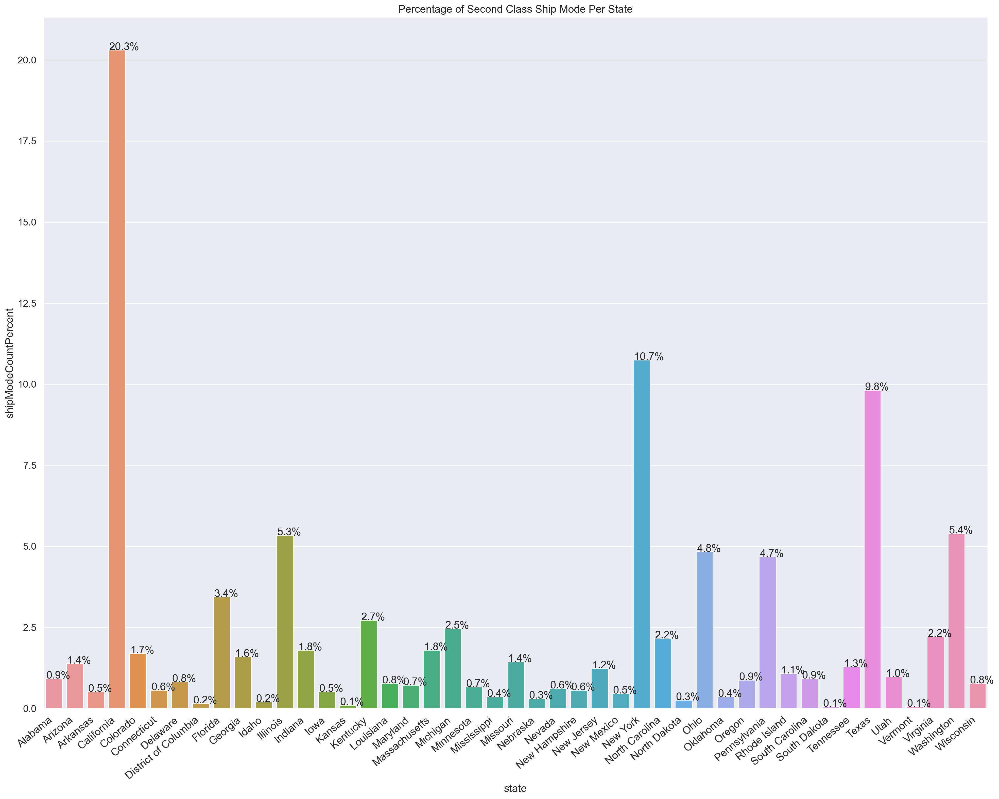

In [20]:
secondClassShipModePerStateSeries = df[df['Ship Mode']=='Second Class'].groupby(['State']).count()['Ship Mode'] #series of required condition
secondClassShipModePerStateDf=pd.DataFrame({'state': secondClassShipModePerStateSeries.index, 'shipModeCount': secondClassShipModePerStateSeries.values}) #dataframe of the above series
shipModeCountTotal=secondClassShipModePerStateDf['shipModeCount'].sum()
secondClassShipModePerStateDf['shipModeCountPercent']=secondClassShipModePerStateDf.apply(lambda x:(x['shipModeCount']/shipModeCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=secondClassShipModePerStateDf.state,y=secondClassShipModePerStateDf.shipModeCountPercent, data=secondClassShipModePerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of Second Class Ship Mode Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show() 

#### #Standard Class Ship Mode and State

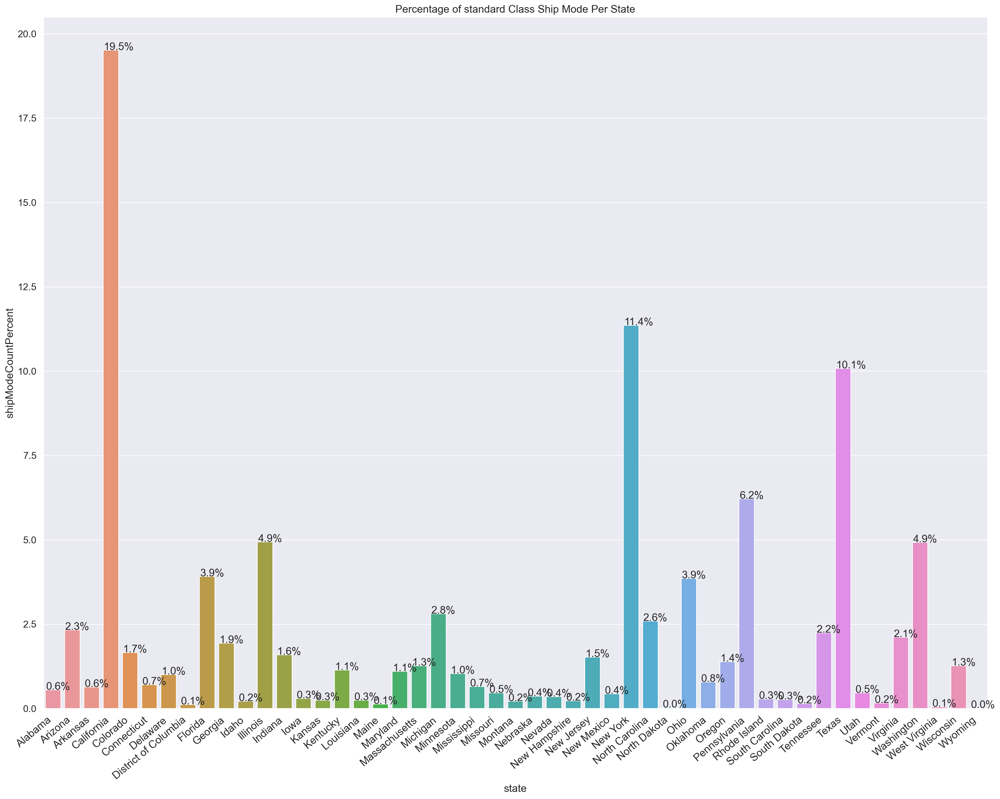

In [21]:
standardClassShipModePerStateSeries = df[df['Ship Mode']=='Standard Class'].groupby(['State']).count()['Ship Mode'] #series of required condition
standardClassShipModePerStateDf=pd.DataFrame({'state': standardClassShipModePerStateSeries.index, 'shipModeCount': standardClassShipModePerStateSeries.values}) #dataframe of the above series
shipModeCountTotal=standardClassShipModePerStateDf['shipModeCount'].sum()
standardClassShipModePerStateDf['shipModeCountPercent']=standardClassShipModePerStateDf.apply(lambda x:(x['shipModeCount']/shipModeCountTotal)*100,axis=1)
sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=standardClassShipModePerStateDf.state,y=standardClassShipModePerStateDf.shipModeCountPercent, data=standardClassShipModePerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of standard Class Ship Mode Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show() 

#### #First Class Ship Mode and State

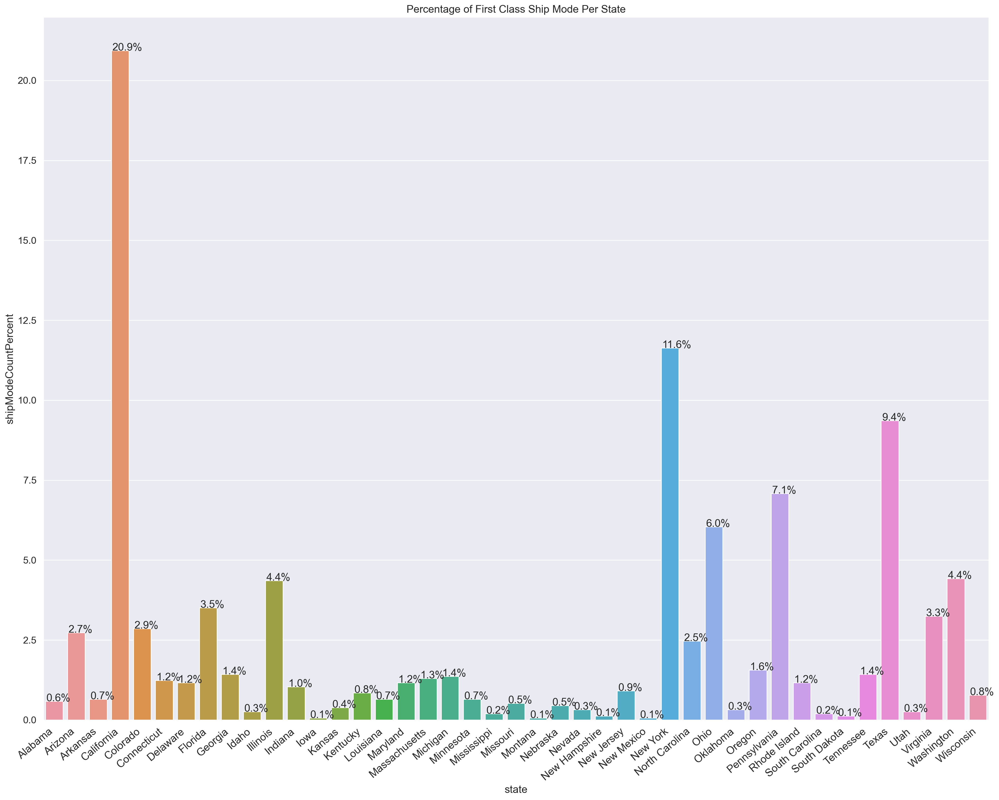

In [22]:
FirstClassShipModePerStateSeries = df[df['Ship Mode']=='First Class'].groupby(['State']).count()['Ship Mode'] #series of required condition
FirstClassShipModePerStateDf=pd.DataFrame({'state': FirstClassShipModePerStateSeries.index, 'shipModeCount': FirstClassShipModePerStateSeries.values}) #dataframe of the above series
shipModeCountTotal=FirstClassShipModePerStateDf['shipModeCount'].sum()
FirstClassShipModePerStateDf['shipModeCountPercent']=FirstClassShipModePerStateDf.apply(lambda x:(x['shipModeCount']/shipModeCountTotal)*100,axis=1)
sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=FirstClassShipModePerStateDf.state,y=FirstClassShipModePerStateDf.shipModeCountPercent, data=FirstClassShipModePerStateDf) #plotting the barplot
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of First Class Ship Mode Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show() 

#### #Same Day Ship Mode and State

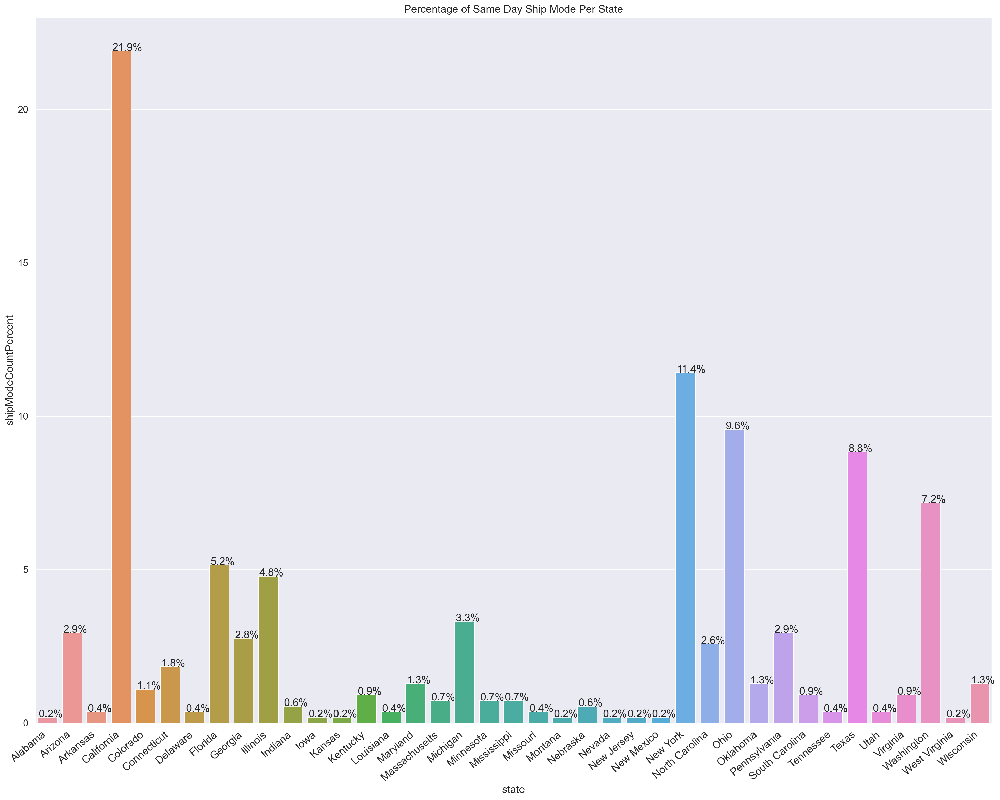

In [23]:
SameDayShipModePerStateSeries = df[df['Ship Mode']=='Same Day'].groupby(['State']).count()['Ship Mode'] #series of required condition
SameDayShipModePerStateDf=pd.DataFrame({'state': SameDayShipModePerStateSeries.index, 'shipModeCount': SameDayShipModePerStateSeries.values}) #dataframe of the above series
shipModeCountTotal=SameDayShipModePerStateDf['shipModeCount'].sum()
SameDayShipModePerStateDf['shipModeCountPercent']=SameDayShipModePerStateDf.apply(lambda x:(x['shipModeCount']/shipModeCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=SameDayShipModePerStateDf.state,y=SameDayShipModePerStateDf.shipModeCountPercent, data=SameDayShipModePerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())

ax.set_title('Percentage of Same Day Ship Mode Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show() 

#### Contribution of all the states across the 4 ship modes is relatively consistent

**********************************************************************************************************************************************************************

## Relationship between the State and Segment

to figure out in which state which kind of segment resides

we will plot the graphs for each segment individually

#### #Consumer Segment and State

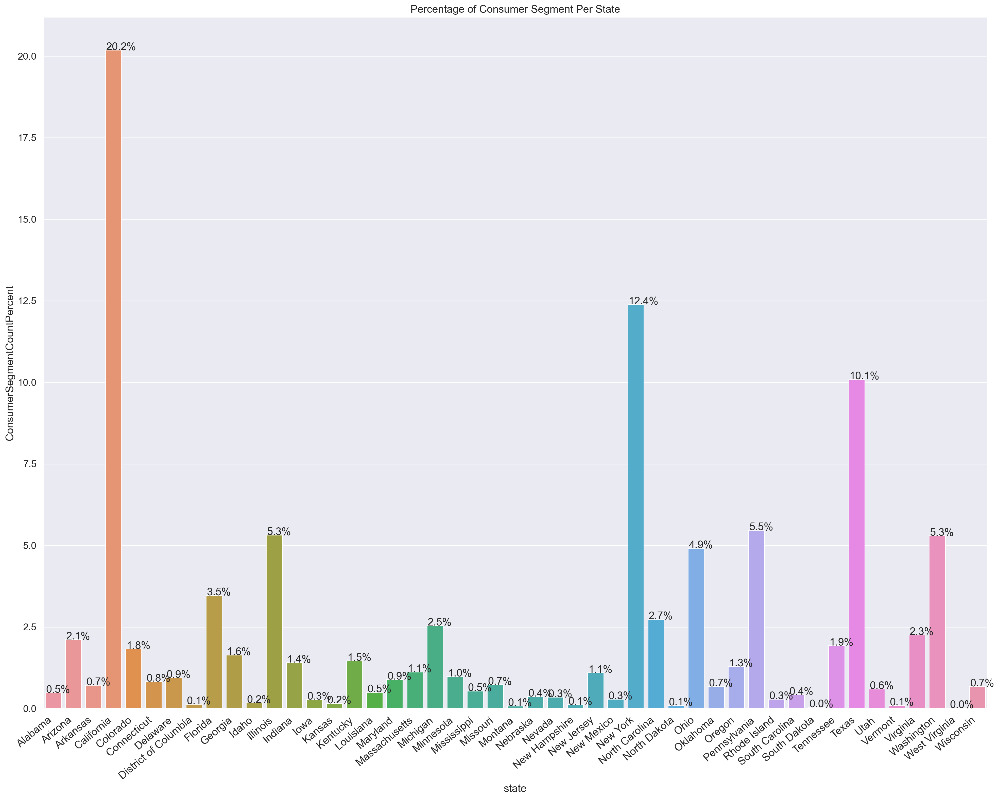

In [26]:
ConsumerSegmentperstateSeries=df[df['Segment']=='Consumer'].groupby(['State']).count()['Segment'] #series of required condition
ConsumerSegmentPerStateDf=pd.DataFrame({'state':ConsumerSegmentperstateSeries.index, 'ConsumerSegmentCount':ConsumerSegmentperstateSeries.values}) #dataframe of the above series
ConsumerSegmentCountTotal=ConsumerSegmentPerStateDf['ConsumerSegmentCount'].sum()
ConsumerSegmentPerStateDf['ConsumerSegmentCountPercent']=ConsumerSegmentPerStateDf.apply(lambda x:(x['ConsumerSegmentCount']/ConsumerSegmentCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=ConsumerSegmentPerStateDf.state,y=ConsumerSegmentPerStateDf.ConsumerSegmentCountPercent, data=ConsumerSegmentPerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())

ax.set_title('Percentage of Consumer Segment Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### #Corporate Segment and State

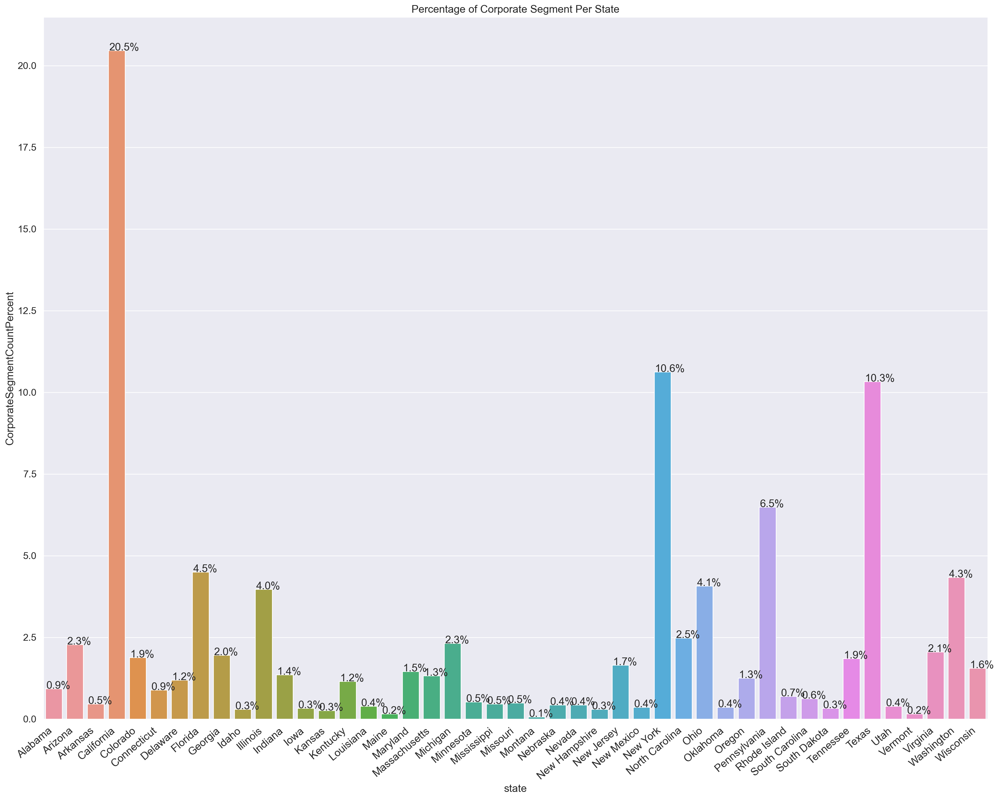

In [27]:
CorporateSegmentperstateSeries=df[df['Segment']=='Corporate'].groupby(['State']).count()['Segment'] #series of required condition
CorporateSegmentPerStateDf=pd.DataFrame({'state':CorporateSegmentperstateSeries.index, 'CorporateSegmentCount':CorporateSegmentperstateSeries.values}) #dataframe of the above series
CorporateSegmentCountTotal=CorporateSegmentPerStateDf['CorporateSegmentCount'].sum()
CorporateSegmentPerStateDf['CorporateSegmentCountPercent']=CorporateSegmentPerStateDf.apply(lambda x:(x['CorporateSegmentCount']/CorporateSegmentCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=CorporateSegmentPerStateDf.state,y=CorporateSegmentPerStateDf.CorporateSegmentCountPercent, data=CorporateSegmentPerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of Corporate Segment Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### #Home Office Segment and State

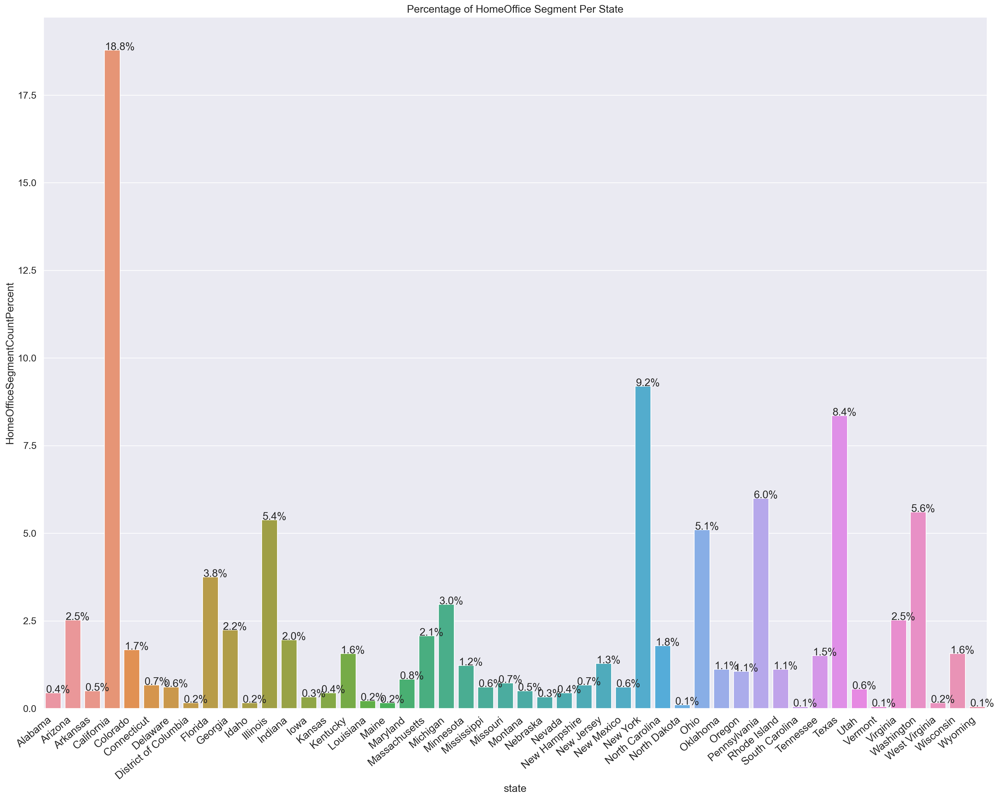

In [28]:
HomeOfficeSegmentperstateSeries=df[df['Segment']=='Home Office'].groupby(['State']).count()['Segment'] #series of required condition
HomeOfficeSegmentPerStateDf=pd.DataFrame({'state':HomeOfficeSegmentperstateSeries.index, 'HomeOfficeSegmentCount':HomeOfficeSegmentperstateSeries.values}) #dataframe of the above series
HomeOfficeSegmentCountTotal=HomeOfficeSegmentPerStateDf['HomeOfficeSegmentCount'].sum()
HomeOfficeSegmentPerStateDf['HomeOfficeSegmentCountPercent']=HomeOfficeSegmentPerStateDf.apply(lambda x:(x['HomeOfficeSegmentCount']/HomeOfficeSegmentCountTotal)*100,axis=1)
sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=HomeOfficeSegmentPerStateDf.state,y=HomeOfficeSegmentPerStateDf.HomeOfficeSegmentCountPercent, data=HomeOfficeSegmentPerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of HomeOffice Segment Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### Contribution of all the states across the 3 segments is relatively consistent

**********************************************************************************************************************************************************************

## Relationship between the State and Category

#### #Office Supplies and State

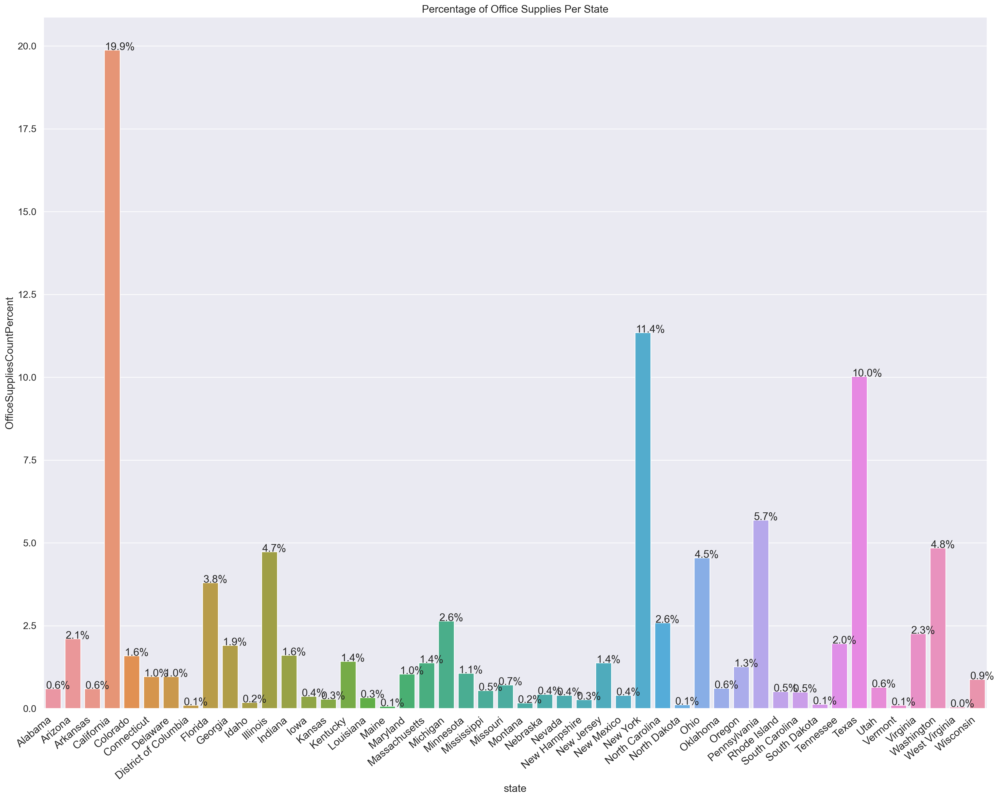

In [30]:
OfficeSuppliesperstateSeries=df[df['Category']=='Office Supplies'].groupby(['State']).count()['Category'] #series of required condition
OfficeSuppliesPerStateDf=pd.DataFrame({'state':OfficeSuppliesperstateSeries.index, 'OfficeSuppliesCount':OfficeSuppliesperstateSeries.values}) #dataframe of the above series
OfficeSuppliesCountTotal=OfficeSuppliesPerStateDf['OfficeSuppliesCount'].sum()
OfficeSuppliesPerStateDf['OfficeSuppliesCountPercent']=OfficeSuppliesPerStateDf.apply(lambda x:(x['OfficeSuppliesCount']/OfficeSuppliesCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=OfficeSuppliesPerStateDf.state,y=OfficeSuppliesPerStateDf.OfficeSuppliesCountPercent, data=OfficeSuppliesPerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of Office Supplies Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### #Furniture and State

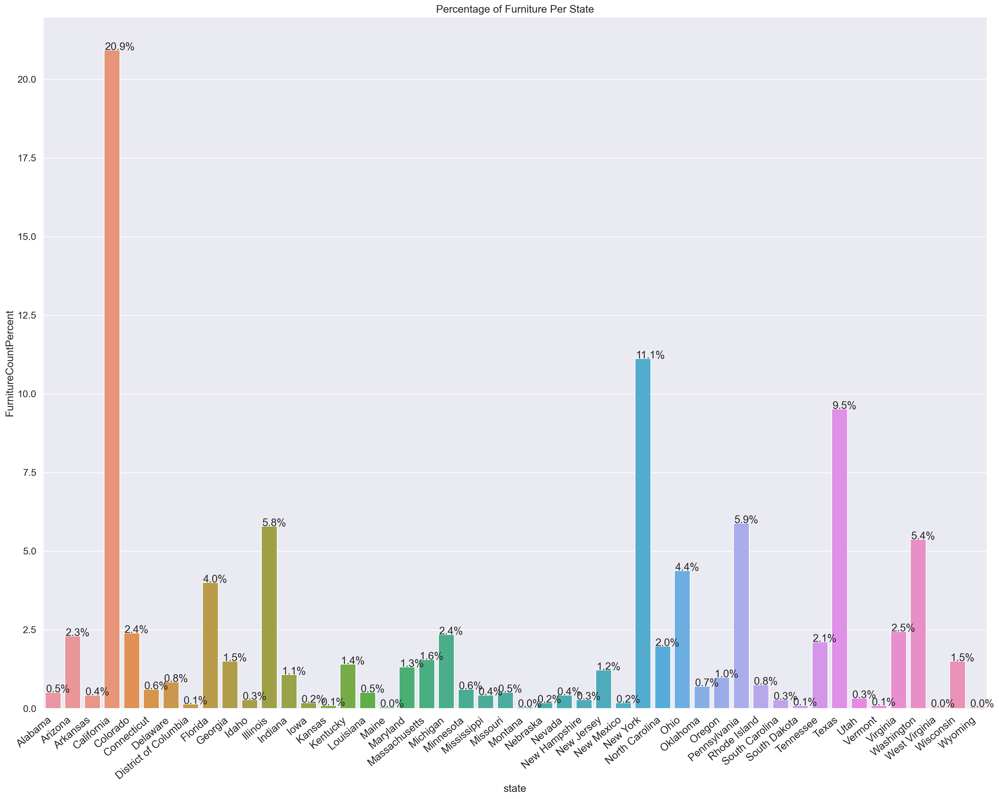

In [31]:
FurnitureperstateSeries=df[df['Category']=='Furniture'].groupby(['State']).count()['Category'] #series of required condition
FurniturePerStateDf=pd.DataFrame({'state':FurnitureperstateSeries.index, 'FurnitureCount':FurnitureperstateSeries.values}) #dataframe of the above series
FurnitureCountTotal=FurniturePerStateDf['FurnitureCount'].sum()
FurniturePerStateDf['FurnitureCountPercent']=FurniturePerStateDf.apply(lambda x:(x['FurnitureCount']/FurnitureCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=FurniturePerStateDf.state,y=FurniturePerStateDf.FurnitureCountPercent, data=FurniturePerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of Furniture Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### #Technology and State

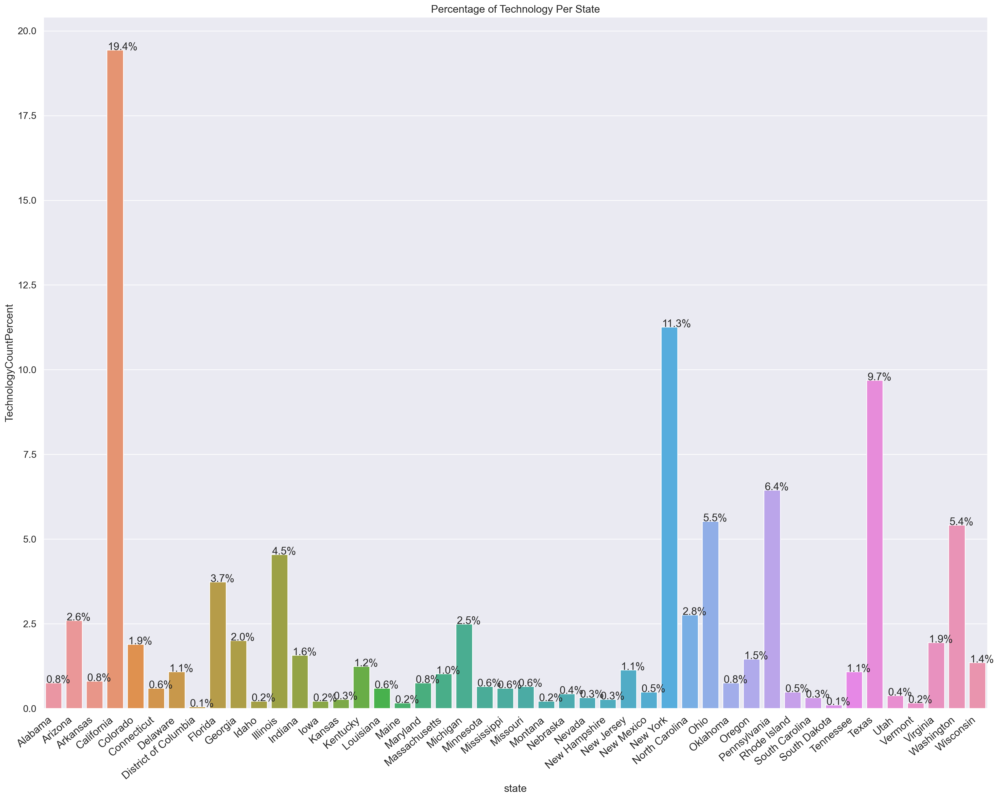

In [118]:
TechnologyperstateSeries=df[df['Category']=='Technology'].groupby(['State']).count()['Category'] #series of required condition
TechnologyPerStateDf=pd.DataFrame({'state':TechnologyperstateSeries.index, 'TechnologyCount':TechnologyperstateSeries.values}) #dataframe of the above series
TechnologyCountTotal=TechnologyPerStateDf['TechnologyCount'].sum()
TechnologyPerStateDf['TechnologyCountPercent']=TechnologyPerStateDf.apply(lambda x:(x['TechnologyCount']/TechnologyCountTotal)*100,axis=1)

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.

plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=TechnologyPerStateDf.state,y=TechnologyPerStateDf.TechnologyCountPercent, data=TechnologyPerStateDf) #plotting the barplot

for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1f%%"% rect.get_height())
    
ax.set_title('Percentage of Technology Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()  

#### Contribution of all the states across the 3 Categories is relatively consistent, which concludes that there is no dominance of a single category for specific state.

**********************************************************************************************************************************************************************

## Relationship between the State and the Sales

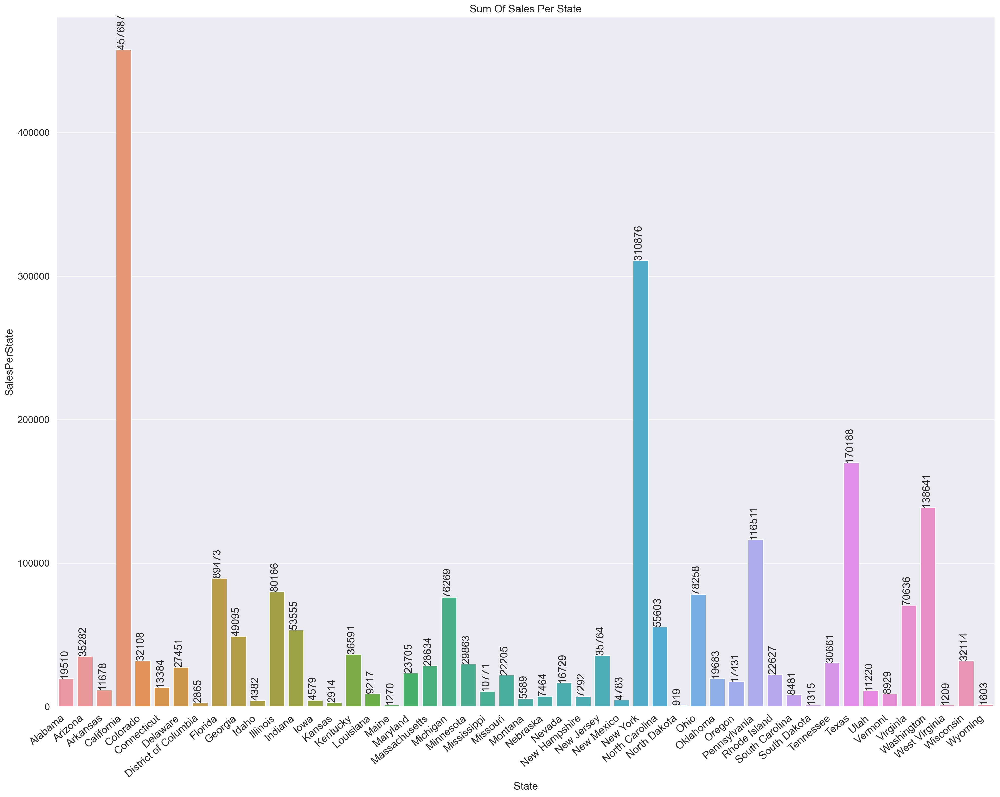

In [34]:
SalesperstateSeries=df.groupby(['State']).sum()['Sales']
SalesperstateSeriesDf=pd.DataFrame({'State':SalesperstateSeries.index,'SalesPerState':SalesperstateSeries.values})

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.
plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.
ax=sns.barplot(x=SalesperstateSeriesDf.State,y=SalesperstateSeriesDf.SalesPerState, data=SalesperstateSeriesDf) #plotting the barplotsns.set(font_scale=1.25) #to increase the font size 
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1d"% rect.get_height(), va='bottom',rotation=90)

ax.set_title('Sum Of Sales Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()          

#### There are few states which has sales more than a lakh namely California,New York,Texas and Washington etc. 

#### some of the states has sales barely close to 1000 like North Dakota,Maine,South Dakota,West Virginia etc.

## Relationship Between State and Quantity

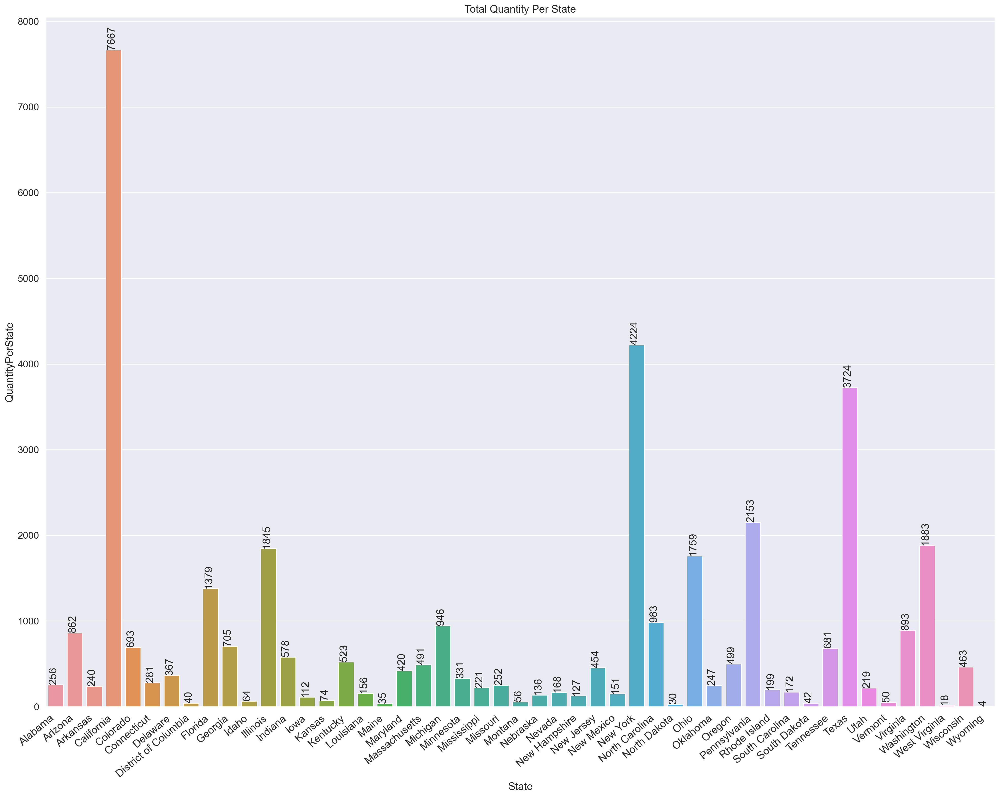

In [35]:
QuantityperstateSeries=df.groupby(['State']).sum()['Quantity']
QuantityperstateSeriesDf=pd.DataFrame({'State':QuantityperstateSeries.index,'QuantityPerState':QuantityperstateSeries.values})

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.
plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=QuantityperstateSeriesDf.State,y=QuantityperstateSeriesDf.QuantityPerState, data=QuantityperstateSeriesDf) #plotting the barplotsns.set(font_scale=1.25) #to increase the font size 
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1d"% rect.get_height(), va='bottom',rotation=90)

ax.set_title('Total Quantity Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()          

### RELATIONSHIP BETWEEN DISCOUNT AND SALES,PROFIT,QUANTITY

In [28]:
DiscountRelationship=df.groupby(['Discount']).sum()[['Sales','Profit','Quantity']]
DiscountRelationship['ProfitPerQuantity']=DiscountRelationship.apply(lambda i:i['Profit']/i['Quantity'],axis=1)
DiscountRelationship

,Sales,Profit,Quantity,ProfitPerQuantity
Discount,,,,
0.00,1.087908e+06,320987.6032,18267,17.571993
0.10,5.436935e+04,9029.1770,373,24.206909
0.15,2.755852e+04,1418.9915,198,7.166624
0.20,7.645944e+05,90337.3060,13660,6.613273
0.30,1.032267e+05,-10369.2774,849,-12.213519
0.32,1.449346e+04,-2391.1377,105,-22.772740
0.40,1.164178e+05,-23057.0504,786,-29.334670
0.45,5.484974e+03,-2493.1111,45,-55.402469
0.50,5.891854e+04,-20506.4281,241,-85.088913


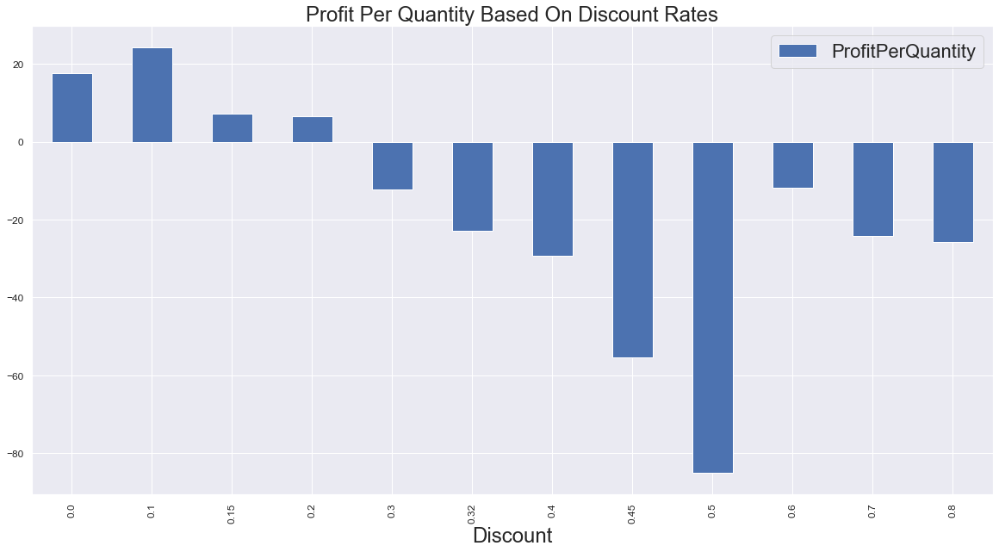

In [44]:
DiscountRelationship[['ProfitPerQuantity']].plot(kind='bar',figsize=[20,10],fontsize=12)
plt.title('Profit Per Quantity Based On Discount Rates')
plt.show()


#### From the above dataframe we can say that one should give the max discount as 10% beacause beyond that rate profit per quantity is decreasing or the company is incurring loss on per quantity.

## Relationship Between State and Profit

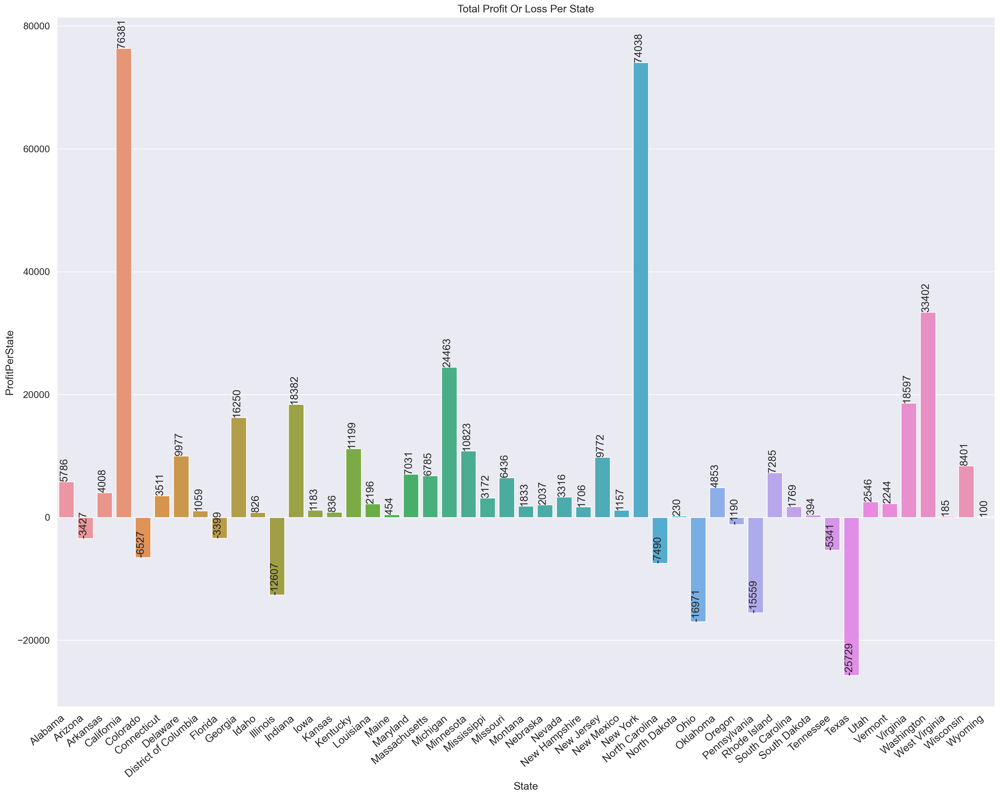

In [56]:
ProfitperstateSeries=df.groupby(['State']).sum()['Profit']
ProfitperstateSeriesDf=pd.DataFrame({'State':ProfitperstateSeries.index,'ProfitPerState':ProfitperstateSeries.values})
sns.set_style('darkgrid')

sns.set(font_scale=1.25) #to increase the font size of title and x & y external labels.
plt.figure(figsize=(20,16), dpi=200, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=ProfitperstateSeriesDf.State,y=ProfitperstateSeriesDf.ProfitPerState, data=ProfitperstateSeriesDf) #plotting the barplotsns.set(font_scale=1.25) #to increase the font size 
for rect in ax.patches:
    ax.text (rect.get_x() + rect.get_width() / 20,rect.get_height(),"%.1d"% rect.get_height(), va='bottom',rotation=90)

ax.set_title('Total Profit Or Loss Per State') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=40, ha="right") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()          

All These states Texas,Ohio,Tennessee,pennsylvania,Oregon,North Carolina,Illinois,Florida,Colorado,Arizona are in loss.

These states are performing very poorly

#### Although Texas and Pennsylvania having more number of sales still these states are in losses proving the point that the profit are not dependent on sales. Their sales are good but they might giving more discount that's why loses were incurred.

##### Let's have a look at which region constitute which state.

In [131]:
df[df['Region']=='Central']['State'].unique()

array(['Texas', 'Wisconsin', 'Nebraska', 'Illinois', 'Minnesota',
       'Michigan', 'Indiana', 'Iowa', 'Missouri', 'Oklahoma', 'Kansas',
       'South Dakota', 'North Dakota'], dtype=object)

#### Loss making states-> Texas and Illinois
#### Above mentioned states are in losses and the remaining states are performing satisfactorily in Central Region.

In [132]:
df[df['Region']=='South']['State'].unique()

array(['Kentucky', 'Florida', 'North Carolina', 'Virginia', 'Tennessee',
       'Alabama', 'South Carolina', 'Louisiana', 'Georgia', 'Mississippi',
       'Arkansas'], dtype=object)

#### Loss making states-> Florida,North carolina,Tennessee
#### Above mentioned states are in losses and the remaining states are performing satisfactorily in South Region.





In [133]:
df[df['Region']=='West']['State'].unique()

array(['California', 'Washington', 'Utah', 'Arizona', 'Oregon',
       'Colorado', 'New Mexico', 'Nevada', 'Montana', 'Idaho', 'Wyoming'],
      dtype=object)

#### Loss making states-> Arizona,Oregon,Colorado
#### Above mentioned states are in losses and the major profit making states CALIFORNIA and WASHINGTON are in this region.

In [9]:
df[df['Region']=='East']['State'].unique()

array(['Pennsylvania', 'Delaware', 'New York', 'Ohio', 'Connecticut',
       'New Jersey', 'Massachusetts', 'Rhode Island', 'New Hampshire',
       'Maryland', 'District of Columbia', 'Vermont', 'Maine',
       'West Virginia'], dtype=object)

#### Loss making states-> Pennsylvania,ohio
#### Above mentioned states are in losses and the major profit making state NEWYORK is in this region, and remaining states are performing satisfactorily. 

### Profit,Quantity,Discount and sales according to the Regions.

In [24]:
discountSeries=df.groupby(['Region']).mean()['Discount']
discountSeriesDF=pd.DataFrame({'Region':discountSeries.index,'Discount':discountSeries.values})
discountSeriesDF

,Region,Discount
0,Central,0.240353
1,East,0.145365
2,South,0.147253
3,West,0.109335


In [25]:
x=df.groupby(['Region']).sum()[['Profit','Quantity','Sales']]
x['ProfitPerQuantity']=x.apply(lambda i:i['Profit']/i['Quantity'],axis=1)
x['SalesPerQuantity']=x.apply(lambda i:i['Sales']/i['Quantity'],axis=1)
pd.merge(x,discountSeriesDF,on='Region')

,Region,Profit,Quantity,Sales,ProfitPerQuantity,SalesPerQuantity,Discount
0,Central,39706.3625,8780,501239.8908,4.522365,57.088826,0.240353
1,East,91522.7800,10618,678781.2400,8.619587,63.927410,0.145365
2,South,46749.4303,6209,391721.9050,7.529301,63.089371,0.147253
3,West,108418.4489,12266,725457.8245,8.838941,59.143798,0.109335


#### WEST REGION - Sales are high because of high sales state(California and Washington),high profit,high quantity as compared to other regions.Discount is also in the permissible range as stated above, there is need of any ammendements in this region.

#### EAST REGION - Sales are quite good because of state(Newyork),profit is also good.We can increase sales by decreasing price per quantity and overall profit also increases because profit per quantity is also good.

#### SOUTH REGION - The sales are almost half of the west and east region, discount price is acceptable,it is having per quantity price relatively high leading to lesser quantity sales, they can decrease per quantity price to increase the sales.

#### CENTRAL REGION - Central can increase the price as they are selling the enough quantity.although increasing price will decrease a small proportion of sales but overall profit could be increase by lowering discount rates and increasing prices, they can increase upto equivalent to west region prices i.e, 59.


### RELATION BETWEEN REGION AND SEGMENT

In [12]:
y=df.groupby(['Region','Segment']).sum().unstack(level=1)['Quantity']
y['ConsumerPercent']=y.apply(lambda i:(i['Consumer']/y['Consumer'].sum())*100,axis=1)
y['CorporatePercent']=y.apply(lambda i:(i['Corporate']/y['Corporate'].sum())*100,axis=1)
y['HomeofficePercent']=y.apply(lambda i:(i['Home Office']/y['Home Office'].sum())*100,axis=1)
y[['ConsumerPercent','CorporatePercent','HomeofficePercent']]

Segment,ConsumerPercent,CorporatePercent,HomeofficePercent
Region,,,
Central,23.149429,22.432805,24.569988
East,27.391015,28.928325,28.365955
South,16.279904,17.367333,15.050415
West,33.179653,31.271537,32.013642


#### Segments are divided almost proportionally along each region thus indicating that there is no dominance of specific segment in any region.

## Relationship between Ship mode and Sales

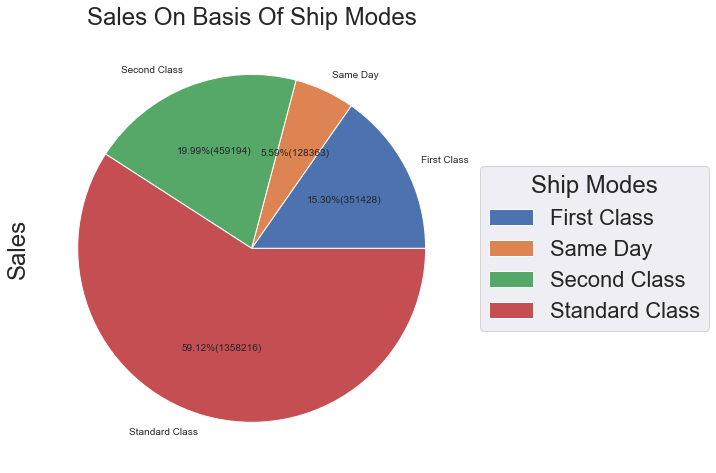

In [39]:
SalesOnShipModesSeries=df.groupby(['Ship Mode']).sum()['Sales']

sns.set(font_scale=2) #outer axis and title font size
ax=SalesOnShipModesSeries.plot(kind='pie', title='Sales On Basis Of Ship Modes', figsize=[10,8],fontsize=10,  #pie chart formation along with the text on it.
          autopct=lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*SalesOnShipModesSeries.sum()))

ax.legend(                         #for giving legend to the figure.
          title ="Ship Modes",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.show()

The sales through Standard class ship mode is 60% of the total sales from other ship modes.

## Relationship between Ship mode and Profit

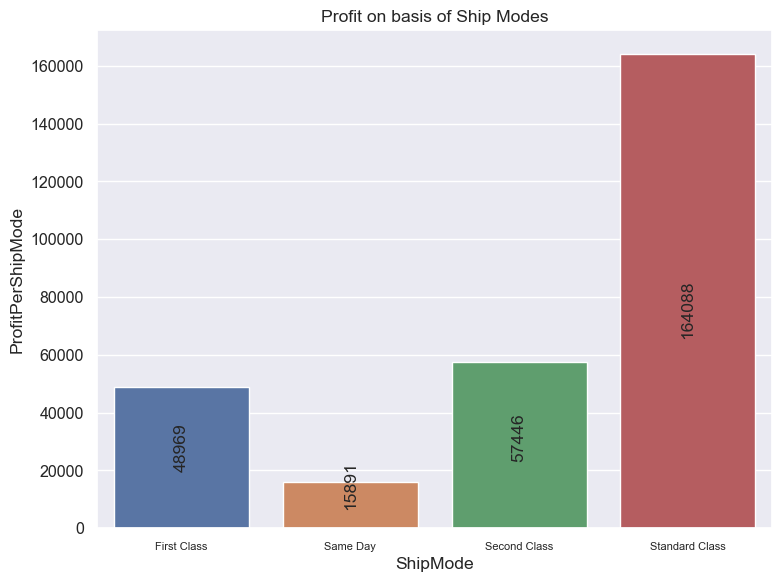

In [41]:
ProfitOnShipModesSeries=df.groupby(['Ship Mode']).sum()['Profit']
ProfitOnShipModesSeriesDf=pd.DataFrame({'ShipMode':ProfitOnShipModesSeries.index,'ProfitPerShipMode':ProfitOnShipModesSeries.values})

sns.set(font_scale=1.05) #to increase the font size of title and x & y external labels.
plt.figure(figsize=(8,6), dpi=100, facecolor='w', edgecolor='k') #to increase the figure size.

ax=sns.barplot(x=ProfitOnShipModesSeriesDf.ShipMode,y=ProfitOnShipModesSeriesDf.ProfitPerShipMode, data=ProfitOnShipModesSeriesDf) #plotting the barplotsns.set(font_scale=1.25) #to increase the font size 
for rect in ax.patches:
    height=rect.get_height()
    ax.text (rect.get_x() + rect.get_width() / 2,0.40*height,"%.1d"% height,ha='center', va='bottom',rotation=90)

ax.set_title('Profit on basis of Ship Modes') #to set the title 
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':8}, rotation=0, ha="center") #to set the fontsize of the x tick labels.

plt.tight_layout() #to remove any overlapping.
plt.show()          

Profit with respect to the ship modes are in proportion to the sales, If the sales are more profit are more and sales are less then profit also less.

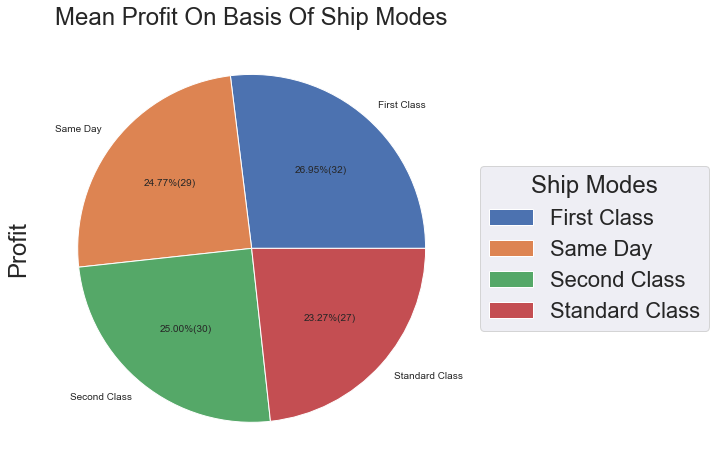

In [136]:
ProfitOnShipModesSeries=df.groupby(['Ship Mode']).mean()['Profit']

sns.set(font_scale=2)
ax=ProfitOnShipModesSeries.plot(kind='pie', title='Mean Profit On Basis Of Ship Modes', figsize=[10,8],fontsize=10,
          autopct=lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*ProfitOnShipModesSeries.sum()))

ax.legend(
          title ="Ship Modes",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.show()

#### Ship mode doesn't have a huge impact on profit, On an average profit per ship mode is same.

****************************************************************************************************************************************************************

#### RELATION BETWEEN CATEGORY SALES,PROFIT AND QUANTITY

In [64]:
DiscountOnCategory=df.groupby(['Category']).mean()['Discount']
DiscountOnCategorydf=pd.DataFrame({'Category':DiscountOnCategory.index,'Discount':DiscountOnCategory.values})

In [63]:
CategoryVsSalesProfitQuantityDF=df.groupby(['Category']).sum()[['Sales','Profit','Quantity']]
CategoryVsSalesProfitQuantityDF['ProfitPerQuantity']=CategoryVsSalesProfitQuantityDF.apply(lambda i:i['Profit']/i['Quantity'],axis=1)
pd.merge(CategoryVsSalesProfitQuantityDF,DiscountOnCategorydf,on='Category')

,Category,Sales,Profit,Quantity,ProfitPerQuantity,Discount
0,Furniture,741999.7953,18451.2728,8028,2.298365,0.173923
1,Office Supplies,719047.0320,122490.8008,22906,5.347542,0.157285
2,Technology,836154.0330,145454.9481,6939,20.961947,0.132323


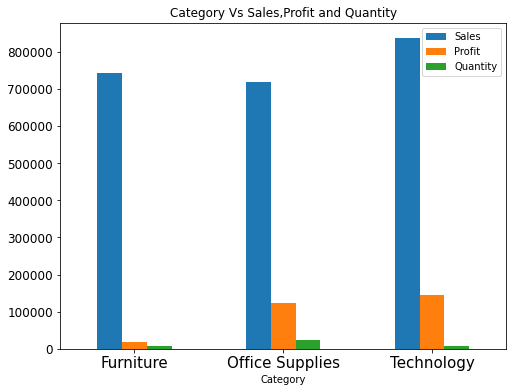

In [44]:
ax=CategoryVsSalesProfitQuantityDF.plot(kind='bar',figsize=[8,6],fontsize=12)
plt.title('Category Vs Sales,Profit and Quantity')
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=0, ha="center")
plt.show()

#### TECHNOLOGY is the high performing category among the 3 categories, this category is having lesser discount leads to profit per quantity quite high and sales are also high. Although quantity sold is less but profit is high because of high profit per quantity.

#### OFFICE SUPPLIES - Quantity is fine, discount rates can be reduced in order to increase the profit per quantity and thus increase the overall sales and quantity.

#### FURNITURE - This category's performance is really bad, there sales are quite high and profit per quantity is very low, if we reduce the discount rates even then also we are not able to have profit margins close to the office supplies because this could affect sales.SO we can look forward to close down this category.


## Relationship between Ship mode and Category

In [137]:
df.groupby(['Ship Mode','Category']).sum().unstack(level=1)[['Profit','Sales']]

Profit                                    Sales  \
Category         Furniture Office Supplies  Technology    Furniture   
Ship Mode                                                             
First Class      3066.9474      18400.3291  27502.5634  110730.5229   
Same Day          797.3484       6423.5192   8670.8913   39148.7790   
Second Class     4226.2614      27068.1676  26152.2064  156289.0244   
Standard Class  10360.7156      70598.7849  83129.2870  435831.4690   

                                            
Category       Office Supplies  Technology  
Ship Mode                                   
First Class         101332.309  139365.591  
Same Day             29090.481   60123.865  
Second Class        160683.003  142221.542  
Standard Class      427941.239  494443.035

##### TECHNOLOGY -  Profit is in correspondent to the sales across each shipping mode.

##### OFFICE SUPPLIES - Profit is in correspondent to the sales across each shipping mode.

##### TECHNOLOGY - Profit is in correspondent to the sales across each shipping mode.

In [30]:
df.groupby(['Ship Mode','Sub-Category']).sum().unstack(level=1)[['Profit']]

Profit                                               \
Sub-Category   Accessories Appliances        Art     Binders  Bookcases   
Ship Mode                                                                 
First Class      5907.4131  3543.8611   750.3500   4128.1425  -305.9975   
Same Day         3866.6910  1091.6577   403.4431   1140.2821   392.5656   
Second Class     8733.6708  4906.6957  1299.1289   5461.3420 -1028.0213   
Standard Class  23428.8608  8595.7909  4074.8650  19491.9967 -2531.1028   

                                                                         \
Sub-Category        Chairs     Copiers  Envelopes Fasteners Furnishings   
Ship Mode                                                                 
First Class      2645.2149  14798.3793  1001.5961  127.0752   2093.0965   
Same Day         1135.6435   2580.9549   348.8148   46.1181    398.5618   
Second Class     6766.2500   6883.8703  1280.4035  158.0298   1808.7126   
Standard Class  16043.0579  31354.6204  4333.3623  618.2951   8758.7727   

                                                                          \
Sub-Category       Labels   Machines       Paper      Phones     Storage   
Ship Mode                                                                  
First Class      804.7152 -1603.4990   4919.2991   8400.2700   3012.1837   
Same Day         245.5642   438.7708   2088.4229   1784.4746    980.2761   
Second Class    1466.7881  2157.0299   7567.0288   8377.6354   5434.3132   
Standard Class  3029.1865  2392.4552  19478.8185  25953.3506  11852.0534   

                                      
Sub-Category    Supplies      Tables  
Ship Mode                             
First Class     113.1062  -1365.3665  
Same Day         78.9402  -1129.4225  
Second Class   -505.5624  -3320.6799  
Standard Class -875.5835 -11910.0122

Binders-> lesser profit on same day delivery,lesser profit on first class with respect to sales , max profit with standard class as sales is also high in this specific mode.

Paper-> lesser on same day and max on standard class

Bookcases->minimal profit in this category, company is having losses in all the ship modes except the one delivered on same day and that too is so minimal..392.
Bookcases is the subcategory of the furniture,One should close this specific category with such high losses as previously we have seen that furniture is not doing well.

Tables->This sub category is in losses in all the shipmodes and it is also the suabcategory of furniture, this category should be closed.
         
machines-> machines are in loss in first class ship mode and overall this category is not so doing well.

Supplies-> This category is in losses in Second class & standard class ship mode despite of good sales in this specific mode.Selling through this mode shouldbe avoided and overall performance in other categorioes is also not so good.

Fasteners-> lowest profit making sub-category,sub-category of office supplies.

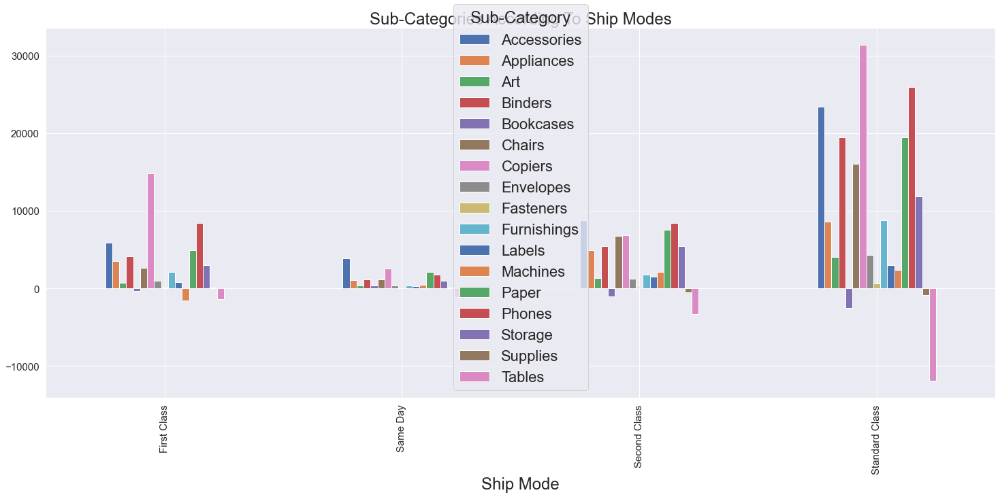

In [45]:
df.groupby(['Ship Mode','Sub-Category']).sum().unstack(level=1)['Profit'].plot(kind='bar',figsize=[25,10],fontsize=15)
plt.title('Sub-Categories According To Ship Modes')
plt.show()

COPIERS - This sub category is the most profitable in first class & standard class as compared to other categories, profitable in same day and second class ship mode also but lesser than other sub categories. Overall it is most profitable category.

TABLES - This sub category is the loss making category in all the ship modes.

BOOKCASES - This sub categoory is also loss making in all the ship modes except same day ship mode and the performance in that ship mode also is not so good.

ACCESSORIES - This sub category is profitable in all the ship modes but performing good in standard class ship mode.

PHONES - This sub category is also profitable in all the ship modes and performing good in standard class ship mode.

overall we can conclude that all the sub-categories are performing good in the standard class ship mode as compared to the other class ship modes.

In [6]:
df[['Category','Sub-Category']].value_counts()

Category         Sub-Category
Office Supplies  Binders         1523
                 Paper           1370
Furniture        Furnishings      957
Technology       Phones           889
Office Supplies  Storage          846
                 Art              796
Technology       Accessories      775
Furniture        Chairs           617
Office Supplies  Appliances       466
                 Labels           364
Furniture        Tables           319
Office Supplies  Envelopes        254
Furniture        Bookcases        228
Office Supplies  Fasteners        217
                 Supplies         190
Technology       Machines         115
                 Copiers           68
dtype: int64

#### Proportion of the loss making sub-categories in the Furniture category.

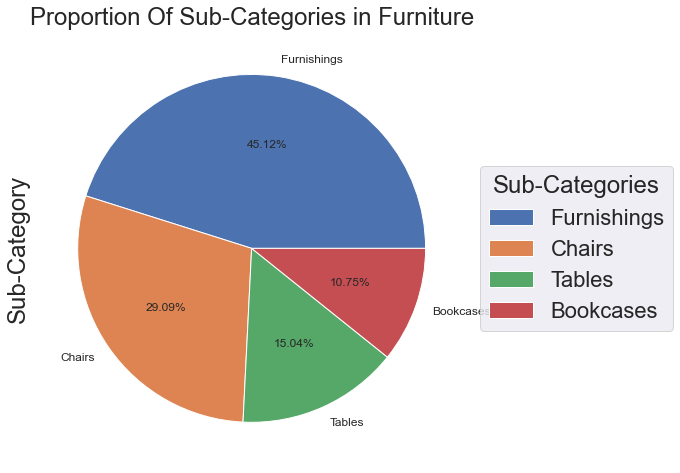

In [7]:
x=df[df['Category']=='Furniture']['Sub-Category'].value_counts()
sns.set(font_scale=2)
ax=x.plot(kind='pie', title='Proportion Of Sub-Categories in Furniture', figsize=[10,8],fontsize=12,
          autopct='%.2f%%')

ax.legend(
          title ="Sub-Categories",
          loc ="center left",
          bbox_to_anchor =(1, 0, 0.5, 1))
  
plt.show()

Since Tables and the Bookcases are the loss making sub-categories under this specific category, They combinedly bagged for 26% of the total Furniture which are in losses and the remaining 2 sub-categories are also not performing up to mark.

Either one can closed this category or try to increase the profit in the remaining 2 sub-categories possibly by reducing discount rates because with the increasing discount rates, the sales are reducing and hence profit is also decreased.

## Sub-Category,Discount and Sales,Profit

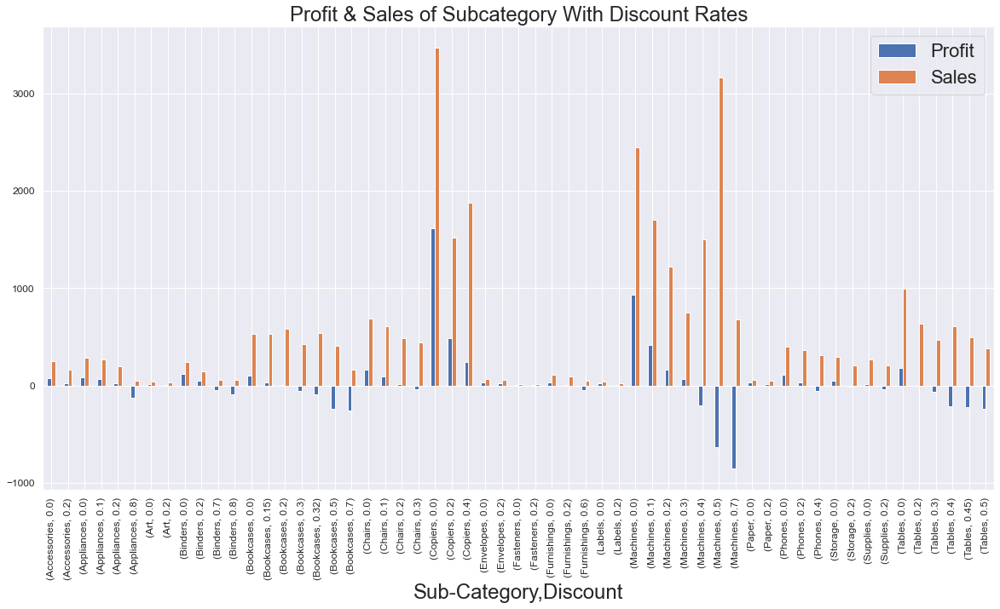

In [46]:
df.groupby(['Sub-Category','Discount']).mean()[['Profit','Sales']].plot(kind='bar',figsize=[20,10],fontsize=12)
plt.title('Profit & Sales of Subcategory With Discount Rates')
plt.show()

With increasing discount rates sales are reducing and profit also reducing, one might have losses.

So increasing discount rates is the major drawback in all the sub categories.

## Sub-Category and Sales,Profit,Quantity

In [48]:
SubCategoryVsSalesProfitQuantityDF=df.groupby(['Sub-Category']).sum()[['Sales','Profit','Quantity']]
SubCategoryVsSalesProfitQuantityDF

,Sales,Profit,Quantity
Sub-Category,,,
Accessories,167380.3180,41936.6357,2976
Appliances,107532.1610,18138.0054,1729
Art,27118.7920,6527.7870,3000
Binders,203412.7330,30221.7633,5974
Bookcases,114879.9963,-3472.5560,868
Chairs,328449.1030,26590.1663,2356
Copiers,149528.0300,55617.8249,234
Envelopes,16476.4020,6964.1767,906
Fasteners,3024.2800,949.5182,914


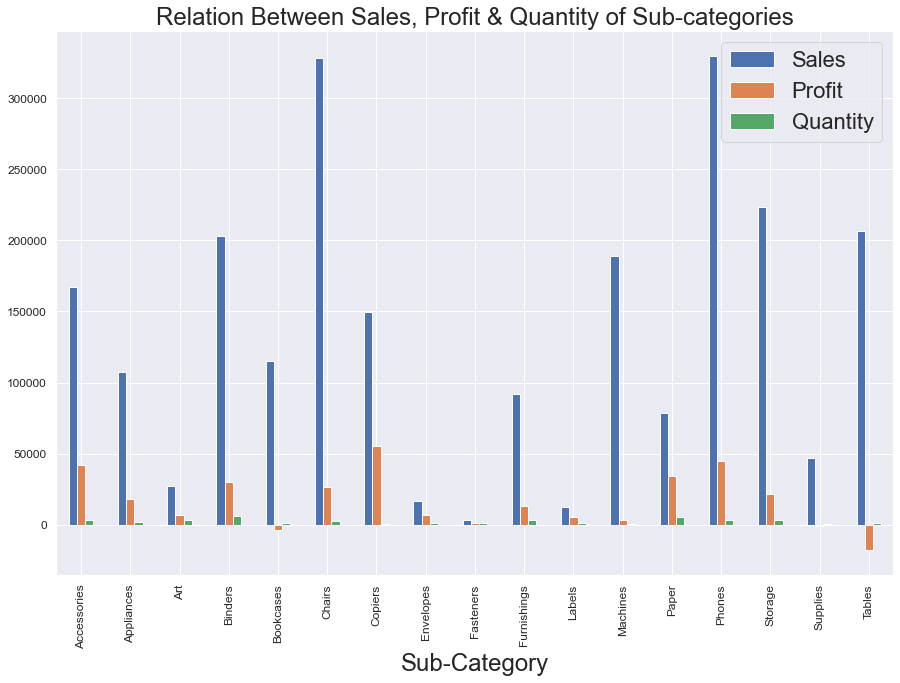

In [49]:
SubCategoryVsSalesProfitQuantityDF.plot(kind='bar',figsize=[15,10],fontsize=12)
plt.title('Relation Between Sales, Profit & Quantity of Sub-categories')
plt.show()

COPIERS- This is the most profitable category, although it's sales and quantity(234) is not so high but profit earned is quite high. It is the sub-category of Technology and bags for only 3.68% of the total category.Since this sub category is profitable so one should focus on this specific to increase it's sales which will in turn maximize the profits.
For this we should reduce the discount rates, lesser the discount rates ,more will be the sales and hence profit.

FASTENERS- This sub category is at it's lowest sales, we can close this sub category and focus on the profit making categories.

## Relationship between Segment and sales,profit,quantity

In [31]:
df.groupby(['Segment']).sum()[['Sales','Profit','Quantity']]

,Sales,Profit,Quantity
Segment,,,
Consumer,1.161401e+06,134119.2092,19521
Corporate,7.061464e+05,91979.1340,11608
Home Office,4.296531e+05,60298.6785,6744


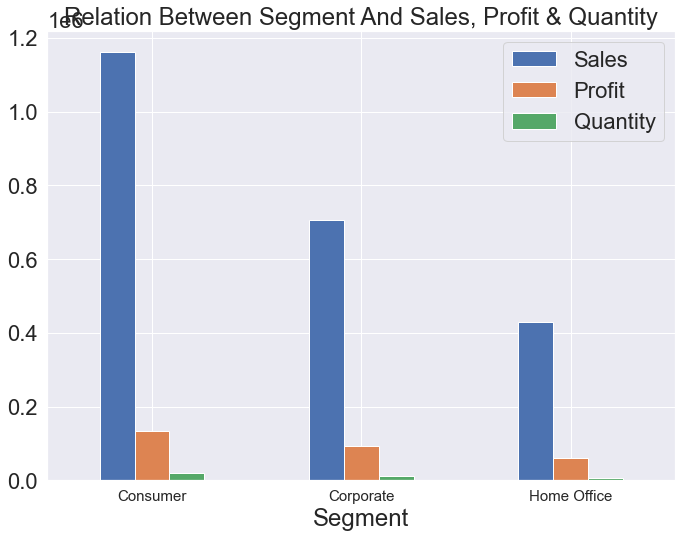

In [54]:
ax=df.groupby(['Segment']).sum()[['Sales','Profit','Quantity']].plot(kind='bar',figsize=[10,8])
plt.title('Relation Between Segment And Sales, Profit & Quantity')
ax.set_xticklabels(ax.get_xticklabels(),{'fontsize':15}, rotation=0, ha="center")
plt.tight_layout()
plt.show()

#### overall contribution in sales & profit of Consumer segment is higher.

#### Profit per item is higher in corporate and home office segment.

## OVERALL CONCLUSION

#### *The max discount should be 10% because beyond that rate profit per quantity is decreasing or the company is incurring loss on per quantity.With the increasing rates sales and profit are reducing and at some places leadind to losses.

#### **Contribution of all the states across the 4 ship modes is relatively consistent
#### *Contribution of all the states across the 3 segments is relatively consistent
#### *Contribution of all the states across the 3 Categories is relatively consistent, which concludes that there is no dominance of a single category for specific state.
#### *All These states Texas,Ohio,Tennessee,pennsylvania,Oregon,North Carolina,Illinois,Florida,Colorado,Arizona are in loss.
#### *Profits are not only dependent on sales, there have certain cases where despite of higher sales, losses are incurred.
#### *West region and East region's performance is quite good in terms of sales,profit and quantity whereas South and Central region requires some changes for better performance,South region's price per quantity should be decreased to increase profit and quantity and Central region's discount should be decreased and price per quantity should be increased.
#### *Ship mode doesn't have a huge impact on profit, On an average profit per ship mode is same. 
#### *Technology is the better performing category among the 3 categories having 20.96 profit per quantity.
#### *Furniture category's sub category namely tables and bookcases should be closed permenantly as they are leading this category in losses and should focus on remaining 2 categories.
